In [1]:
import os

if os.getcwd().split("/")[-1] != "neurolib":
    os.chdir('..')

os.chdir('..')
datadir = os.path.join(os.getcwd(), "neurolib", "whole-brain")

print(datadir)

/mnt/antares_raid/home/salfenmoser/neurolib/neurolib/whole-brain


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.io
from numba.typed import Dict
from numba.core import types
import pickle

from neurolib.models.wc import WCModel
from neurolib.utils.stimulus import ZeroInput
from neurolib.control.optimal_control import oc_wc, cost_functions

import matplotlib as mpl
label_size= 20
mpl.rcParams['xtick.labelsize'] = label_size
mpl.rcParams['ytick.labelsize'] = label_size
mpl.rcParams['font.size'] = label_size
mpl.rcParams['axes.titlesize'] = label_size
mpl.rcParams['axes.titlesize'] = label_size
mpl.rcParams['figure.titlesize'] = label_size
mpl.rcParams['lines.linewidth'] = 1


# This will reload all imports as soon as the code changes
%load_ext autoreload
%autoreload 2

weights = Dict.empty(
        key_type=types.unicode_type,
        value_type=types.float64,
    )

weights["w_2"] = 0.0
weights["w_1"] = 0.0
weights["w_1T"] = 0.0
weights["w_1D"] = 1.0

In [3]:
N = 100

folders = ["NAP_002", "NAP_003", "NAP_005", "NAP_007", "NAP_009", "NAP_010", "NAP_011", "NAP_012", "NAP_013", "NAP_014", "NAP_015", "NAP_016", "NAP_018", "NAP_020", "NAP_022", "NAP_024", "NAP_025", "NAP_026", "NAP_027", "NAP_028", "NAP_029", "NAP_031", "NAP_032", "NAP_033", "NAP_035", "NAP_036"]
cmat_sum = np.zeros((N,N))
dmat_sum = np.zeros((N,N))

for f in folders:
    path = os.path.join(os.getcwd(), "data", "structural_data", "Sch100", f, "SC", "DTI_CM.mat")
    cmat_sum += scipy.io.loadmat(path)["SC"]
    path = os.path.join(os.getcwd(), "data", "structural_data", "Sch100", f, "SC", "DTI_LEN.mat")
    dmat_sum += scipy.io.loadmat(path)["LEN"]

cmat_av = cmat_sum/len(folders)
dmat_av = dmat_sum/len(folders)

In [4]:
coords = [[1.6, 0.0], [1.7, 0.1]] #1st: multistable     // 2nd: unistable synchronized

data_0_L1, data_1_L1, data_2_L1 = dict(), dict(), dict()
data_0_L1["coordinates"] = coords[0]
data_1_L1["coordinates"] = coords[0]
data_2_L1["coordinates"] = coords[1]
lng = int(4*1e3)

for d in [data_0_L1, data_1_L1, data_2_L1]:
    d["weights"] = np.zeros((100))
    d["control"] = [None] * len(data_0_L1["weights"])
    d["state"] = [None] * len(data_0_L1["weights"])
    d["init_state"] = None
    d["energy_input"] = np.zeros((len(d["weights"])))
    d["sync_cost"] = np.zeros((len(d["weights"])))
    d["state_uncontrolled"] = np.zeros((N,2,lng))

data_1_L1["weights"] *= -1

In [5]:
def setparams(model):
    model.params.c_excinh = 12  # local E-I coupling
    model.params.signalV = 80.0
    model.params.K_gl = 0.5  # global coupling strength
    model.params.a_exc = 1.  # excitatory gain
    model.params.a_inh = 1.  # inhibitory gain
    model.params.mu_exc = 5.0  # excitatory firing threshold
    model.params.mu_inh = 5.0  # inhibitory firing threshold

def plot_control(c, s, dur, dt, fat=[], filename=None, title=None):
    fig, ax = plt.subplots(2,1, figsize=(32,8), sharex=True)
    time_array = np.arange(0, dur+dt, dt)

    cmax = np.amax(np.abs(c))
    y1lim = [-cmax* 1.1, cmax* 1.1]

    for n in range(N):
        if n in fat:
            ax[0].plot(time_array, s[n,0,:], linewidth=4)
        else:
            ax[0].plot(time_array, s[n,0,:])
        ax[1].plot(time_array, c[n,:])

    ax[0].set_xlim(0, dur)

    ax[1].set_ylim(y1lim)

    ax[1].set_xlabel("Time")
    ax[0].set_ylabel("Activity")
    ax[1].set_ylabel("Control")

    plt.subplots_adjust(
                    wspace=0.15,
                    hspace=0.1)
    
    fig.align_ylabels([ax[0]])
    
    if title is not None:
        fig.suptitle(title)

    if filename is not None:
        plt.savefig(filename, bbox_inches='tight', dpi=200)

    plt.show()
    return

def get_results(d, wi, mc):
    d["control"][wi] = mc.control.copy()
    d["state"][wi] = mc.get_xs()
    d["energy_input"][wi] = cost_functions.control_strength_cost(mc.control, weights, dt)
    d["sync_cost"][wi] = (mc.compute_total_cost() - d["energy_input"][wi])/d["weights"][wi]

def dump_data():
    with open(os.path.join(datadir, 'wb_L1_cc_all_2.pickle'), 'wb') as f:
        pickle.dump(data_2_L1, f)

controlmat = np.ones((N))
costmat = np.ones((N))

duration = 400.
target_period = 1

int0 = 0
int1 = None

max_cntrl = 5
pr = np.arange(0,101,1)
dt = 0.1

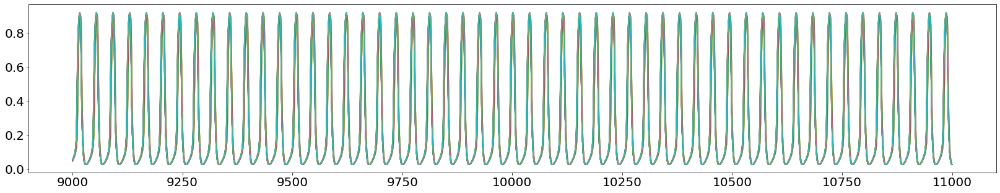

In [7]:
model = WCModel(Cmat=cmat_av, Dmat=dmat_av, seed=0)
testd = 11.*1e3   ## needs to stay 11
dt = model.params.dt
model.params.duration = testd
setparams(model)

model.params.exc_ext_baseline = data_2_L1["coordinates"][0]
model.params.exc_inh_baseline = data_2_L1["coordinates"][1]

#model.params.exc_ext = input
model.run()

plt.figure(figsize=(28,5))

for n in range(N):
    plt.plot(model.t[-int(2.*1e3/dt):], model.exc[n,-int(2.*1e3/dt):], linewidth=1)
plt.show()

nmaxdelay = model.getMaxDelay()
einit = np.zeros((N, nmaxdelay+1))
iinit = np.zeros((N, nmaxdelay+1))

state = np.zeros((N,2,lng))

for n in range(N):
    einit[n,:] = model.exc[n,-nmaxdelay-1:]
    iinit[n,:] = model.inh[n,-nmaxdelay-1:]
    state[n,0,:] = model.exc[n, -lng:]

data_2_L1["init_state"] = [einit, iinit]
data_2_L1["state_uncontrolled"] = state.copy()

In [6]:
with open(os.path.join(datadir, 'wb_L1_cc_all_2.pickle'), 'rb') as f:
    data_read = pickle.load(f)

data_2_L1 = data_read

In [11]:
print(data_2_L1["weights"])

[ -10.  -12.  -14.  -16.  -18.  -20.  -22.  -24.  -26.  -28.  -30.  -32.
  -34.  -36.  -38.  -40.  -42.  -44.  -46.  -48.  -50.  -52.  -54.  -56.
  -58.  -60.  -62.  -64.  -66.  -68.  -70.  -72.  -74.  -76.  -78.  -80.
  -82.  -84.  -86.  -88.  -90.  -92.  -94.  -96.  -98. -100. -102. -104.
 -106. -108. -110. -112. -114. -116. -118. -120. -122. -124. -126. -128.
 -130. -132. -134. -136. -138. -140. -142. -144. -146. -148. -150. -152.
 -154. -156. -158. -160. -162. -164. -166. -168. -170. -172. -174. -176.
 -178. -180. -182. -184. -186. -188. -190. -192. -194. -196. -198. -200.
 -202. -204. -206. -208.]


In [9]:
data_2_L1["weights"][0] = -10.
for n in range(N-1):
    data_2_L1["weights"][n+1] = data_2_L1["weights"][n] - 2.

In [7]:
def optimize_model(model, step_exp_array, wi, it):
    for k in step_exp_array:
        model.zero_step_encountered = False
        model.step = 10.**(k)
        model.optimize(it)

        get_results(d, wi, model)
        dump_data()

In [8]:
convergence = np.zeros((100))

------------------------------------------------------------ wi =  3 -16.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 15.502744993808069
Final cost : 15.502744993808069
Compute control for a deterministic system
Cost in iteration 0: 12.204162557496957
Final cost : 12.204162557496957
Compute control for a deterministic system
Cost in iteration 0: 12.204162557496957
Cost in iteration 1: 12.204139657474116
Cost in iteration 2: 12.204139657474105
Cost in iteration 3: 12.204139657474071
Cost in iteration 4: 12.204139657474068
Cost in iteration 5: 12.204139657474068
Cost in iteration 6: 12.204139657474068
Converged in iteration 6 with cost 12.204139657474068
Final cost : 12.204139657474068
Compute control for a deterministic system
Cost in iteration 0: 12.204139657474068
Cost in iteration 1: 12.204139649777773
Cost in iteration 2: 12.204139649777762
Cost in iteration 3: 12.204139649777755
Cost in iteration 4: 12.204139649777

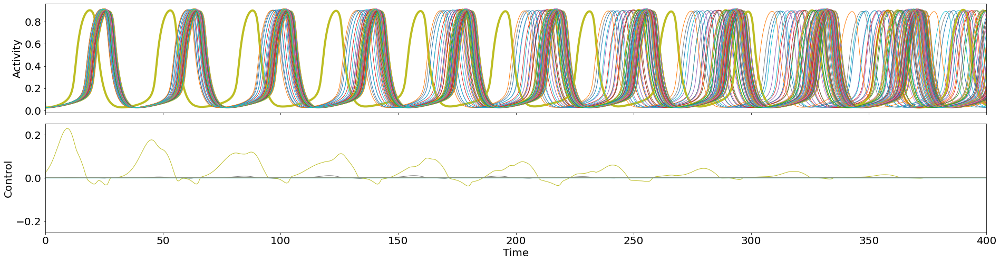

------------------------------------------------------------ wi =  4 -18.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 17.44058811803408
Final cost : 17.44058811803408
Compute control for a deterministic system
Cost in iteration 0: 12.721519970587547
Final cost : 12.721519970587547
Compute control for a deterministic system
Cost in iteration 0: 12.721519970587547
Cost in iteration 1: 12.721439689389051
Cost in iteration 2: 12.721439689389051
Cost in iteration 3: 12.721439689389051
Converged in iteration 3 with cost 12.721439689389051
Final cost : 12.721439689389051
Compute control for a deterministic system
Cost in iteration 0: 12.721439689389051
Cost in iteration 1: 12.721439689389051
Cost in iteration 2: 12.721439689389051
Converged in iteration 2 with cost 12.721439689389051
Final cost : 12.721439689389051
Compute control for a deterministic system
Cost in iteration 0: 12.721439689389051
Cost in iteration 1: 12.72143

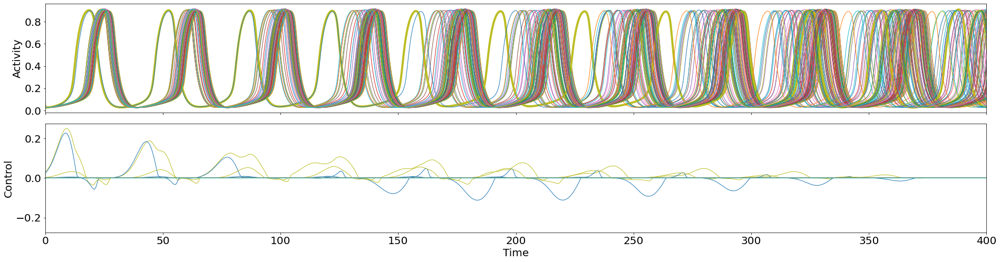

------------------------------------------------------------ wi =  5 -20.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 19.37843124226007
Final cost : 19.37843124226007
Compute control for a deterministic system
Cost in iteration 0: 13.311501666765361
Final cost : 13.311501666765361
Compute control for a deterministic system
Cost in iteration 0: 13.311501666765361
Cost in iteration 1: 13.311501666765361
Cost in iteration 2: 13.311501666764855
Cost in iteration 3: 13.311501666756556
Cost in iteration 4: 13.311501666756556
Cost in iteration 5: 13.311501666756556
Converged in iteration 5 with cost 13.311501666756556
Final cost : 13.311501666756556
Compute control for a deterministic system
Cost in iteration 0: 13.311501666756556
Cost in iteration 1: 13.311501666756556
Cost in iteration 2: 13.311501666756556
Converged in iteration 2 with cost 13.311501666756556
Final cost : 13.311501666756556
Compute control for a determinis

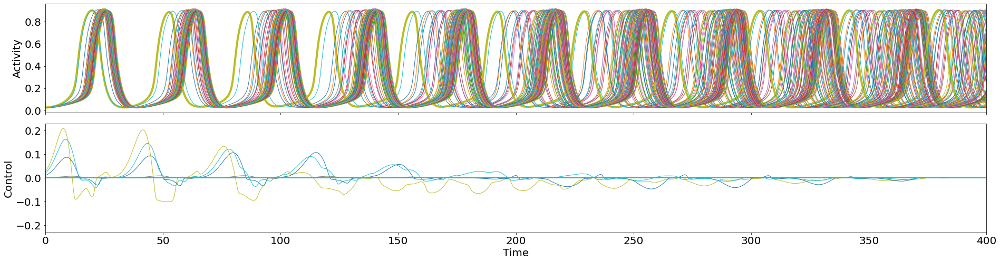

------------------------------------------------------------ wi =  6 -22.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 21.316274366486116
Final cost : 21.316274366486116
Compute control for a deterministic system
Cost in iteration 0: 14.953996662197023
Final cost : 14.953996662197023
Compute control for a deterministic system
Cost in iteration 0: 14.953996662197023
Cost in iteration 1: 14.953962293714172
Cost in iteration 2: 14.953962293714172
Cost in iteration 3: 14.953962293714172
Converged in iteration 3 with cost 14.953962293714172
Final cost : 14.953962293714172
Compute control for a deterministic system
Cost in iteration 0: 14.953962293714172
Cost in iteration 1: 14.953962293714172
Cost in iteration 2: 14.953962293714172
Converged in iteration 2 with cost 14.953962293714172
Final cost : 14.953962293714172
Compute control for a deterministic system
Cost in iteration 0: 14.953962293714172
Cost in iteration 1: 14.953

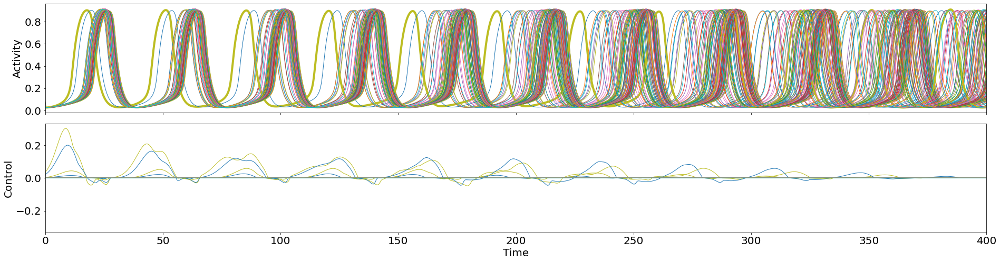

------------------------------------------------------------ wi =  7 -24.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 23.254117490712098
Final cost : 23.254117490712098
Compute control for a deterministic system
Cost in iteration 0: 14.84838343899825
Final cost : 14.84838343899825
Compute control for a deterministic system
Cost in iteration 0: 14.84838343899825
Cost in iteration 1: 14.84838343899825
Cost in iteration 2: 14.84838343899825
Converged in iteration 2 with cost 14.84838343899825
Final cost : 14.84838343899825
Compute control for a deterministic system
Cost in iteration 0: 14.84838343899825
Cost in iteration 1: 14.84838343899825
Cost in iteration 2: 14.84838343899825
Converged in iteration 2 with cost 14.84838343899825
Final cost : 14.84838343899825
Compute control for a deterministic system
Cost in iteration 0: 14.84838343899825
Cost in iteration 1: 14.848041068952913
Cost in iteration 2: 14.848041068923656


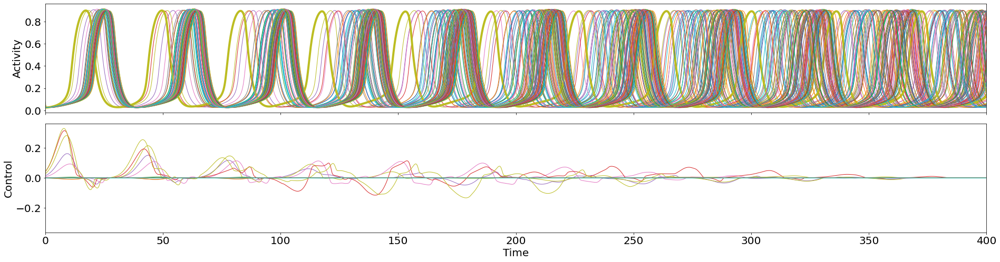

------------------------------------------------------------ wi =  8 -26.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 25.191960614938054
Final cost : 25.191960614938054
Compute control for a deterministic system
Cost in iteration 0: 15.22739296982845
Final cost : 15.22739296982845
Compute control for a deterministic system
Cost in iteration 0: 15.22739296982845
Cost in iteration 1: 15.22739296982845
Cost in iteration 2: 15.22739296982845
Cost in iteration 3: 15.227392969828333
Cost in iteration 4: 15.227392969827877
Cost in iteration 5: 15.227392969827877
Cost in iteration 6: 15.227392969827877
Converged in iteration 6 with cost 15.227392969827877
Final cost : 15.227392969827877
Compute control for a deterministic system
Cost in iteration 0: 15.227392969827877
Cost in iteration 1: 15.227392969827877
Cost in iteration 2: 15.227392969827877
Converged in iteration 2 with cost 15.227392969827877
Final cost : 15.22739296982

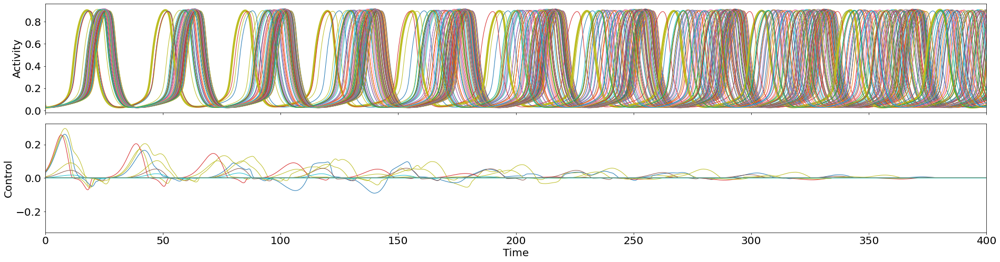

------------------------------------------------------------ wi =  9 -28.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 27.12980373916424
Final cost : 27.12980373916424
Compute control for a deterministic system
Cost in iteration 0: 17.163960008272465
Final cost : 17.163960008272465
Compute control for a deterministic system
Cost in iteration 0: 17.163960008272465
Cost in iteration 1: 17.163946392367052
Cost in iteration 2: 17.163946392366938
Cost in iteration 3: 17.163946392366938
Cost in iteration 4: 17.163946392366938
Converged in iteration 4 with cost 17.163946392366938
Final cost : 17.163946392366938
Compute control for a deterministic system
Cost in iteration 0: 17.163946392366938
Cost in iteration 1: 17.163946392366938
Cost in iteration 2: 17.163946392366938
Converged in iteration 2 with cost 17.163946392366938
Final cost : 17.163946392366938
Compute control for a deterministic system
Cost in iteration 0: 17.16394

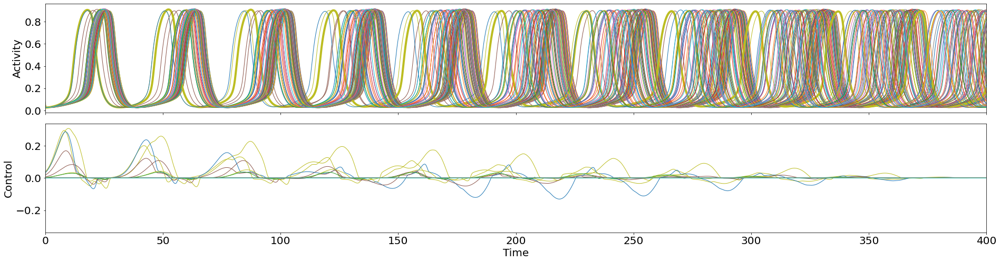

------------------------------------------------------------ wi =  10 -30.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 29.06764686339009
Final cost : 29.06764686339009
Compute control for a deterministic system
Cost in iteration 0: 17.37083006642345
Final cost : 17.37083006642345
Compute control for a deterministic system
Cost in iteration 0: 17.37083006642345
Cost in iteration 1: 17.37081844215613
Cost in iteration 2: 17.370818442156107
Cost in iteration 3: 17.370818442156054
Cost in iteration 4: 17.370818442156054
Cost in iteration 5: 17.370818442156054
Converged in iteration 5 with cost 17.370818442156054
Final cost : 17.370818442156054
Compute control for a deterministic system
Cost in iteration 0: 17.370818442156054
Cost in iteration 1: 17.222528566120307
Cost in iteration 2: 17.222528566120307
Cost in iteration 3: 17.222528566120307
Converged in iteration 3 with cost 17.222528566120307
Final cost : 17.22252856612

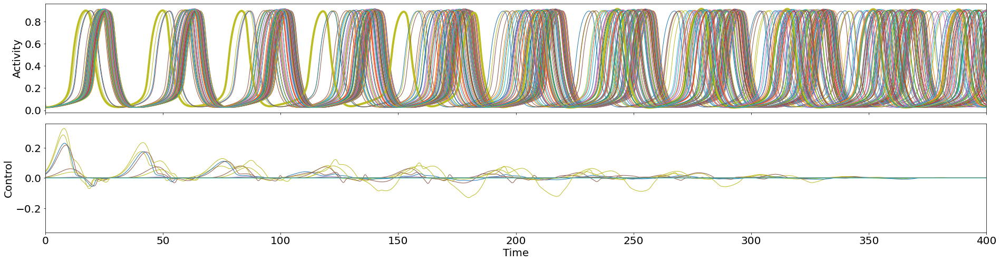

------------------------------------------------------------ wi =  11 -32.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 31.005489987616137
Final cost : 31.005489987616137
Compute control for a deterministic system
Cost in iteration 0: 17.45096105754437
Final cost : 17.45096105754437
Compute control for a deterministic system
Cost in iteration 0: 17.45096105754437
Cost in iteration 1: 17.450959624478358
Cost in iteration 2: 17.45095675836269
Cost in iteration 3: 17.450951026195785
Cost in iteration 4: 17.450728569127765
Cost in iteration 5: 17.450728569127754
Cost in iteration 6: 17.45072856912775
Final cost : 17.45072856912775
Compute control for a deterministic system
Cost in iteration 0: 17.45072856912775
Cost in iteration 1: 17.441924818500695
Cost in iteration 2: 17.441924818500652
Cost in iteration 3: 17.441924818499132
Cost in iteration 4: 17.441924818499132
Cost in iteration 5: 17.441924818499132
Converged in ite

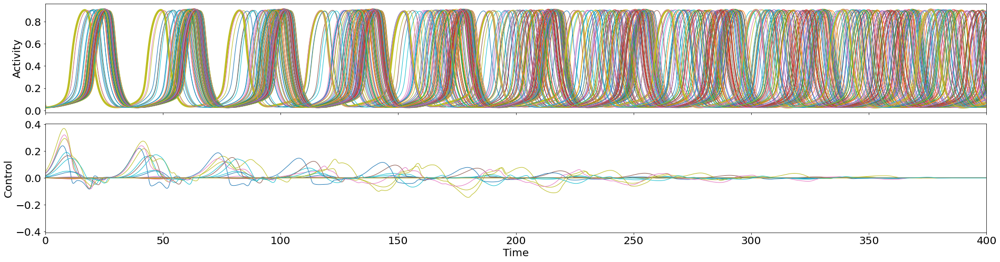

------------------------------------------------------------ wi =  12 -34.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 32.943333111842186
Final cost : 32.943333111842186
Compute control for a deterministic system
Cost in iteration 0: 18.669482641935716
Final cost : 18.669482641935716
Compute control for a deterministic system
Cost in iteration 0: 18.669482641935716
Cost in iteration 1: 18.66946708330316
Cost in iteration 2: 18.66946708330316
Cost in iteration 3: 18.66946708330316
Converged in iteration 3 with cost 18.66946708330316
Final cost : 18.66946708330316
Compute control for a deterministic system
Cost in iteration 0: 18.66946708330316
Cost in iteration 1: 18.66946708330316
Cost in iteration 2: 18.66946708330316
Converged in iteration 2 with cost 18.66946708330316
Final cost : 18.66946708330316
Compute control for a deterministic system
Cost in iteration 0: 18.66946708330316
Cost in iteration 1: 18.6694670833031

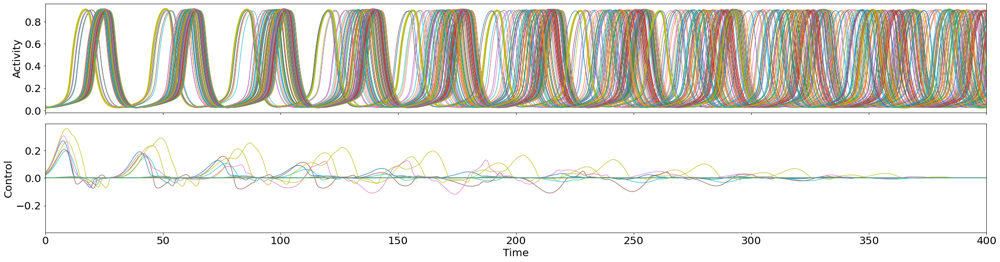

------------------------------------------------------------ wi =  13 -36.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 34.88117623606816
Final cost : 34.88117623606816
Compute control for a deterministic system
Cost in iteration 0: 21.715907769504653
Final cost : 21.715907769504653
Compute control for a deterministic system
Cost in iteration 0: 21.715907769504653
Cost in iteration 1: 21.715522316441195
Cost in iteration 2: 21.714863658095435
Cost in iteration 3: 21.713885106584243
Cost in iteration 4: 21.712743711244084
Cost in iteration 5: 21.711843298631628
Cost in iteration 6: 21.710418514569735
Final cost : 21.710418514569735
Compute control for a deterministic system
Cost in iteration 0: 21.710418514569735
Cost in iteration 1: 21.601275179808034
Cost in iteration 2: 21.601155244585204
Cost in iteration 3: 21.60103620116971
Cost in iteration 4: 21.600916934972563
Cost in iteration 5: 21.600797388044594
Cost in iter

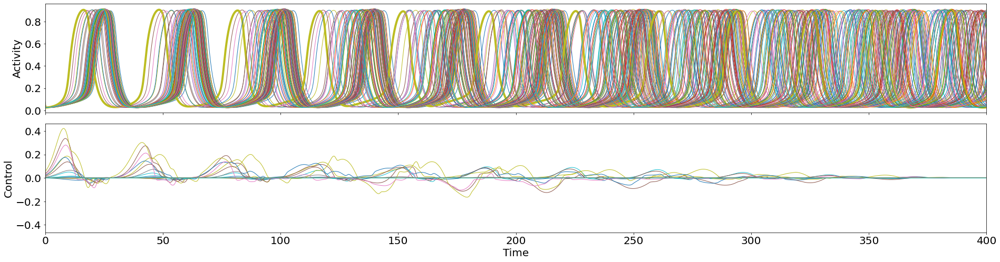

------------------------------------------------------------ wi =  15 -40.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 38.75686248452014
Final cost : 38.75686248452014
Compute control for a deterministic system
Cost in iteration 0: 20.080333870471996
Final cost : 20.080333870471996
Compute control for a deterministic system
Cost in iteration 0: 20.080333870471996
Cost in iteration 1: 20.080328359832166
Cost in iteration 2: 20.080317350824718
Cost in iteration 3: 20.080295381899226
Cost in iteration 4: 20.08025164041178
Cost in iteration 5: 20.08016494289774
Cost in iteration 6: 20.079994689097028
Final cost : 20.079994689097028
Compute control for a deterministic system
Cost in iteration 0: 20.079994689097028
Cost in iteration 1: 20.079994689097028
Cost in iteration 2: 20.079994689097028
Converged in iteration 2 with cost 20.079994689097028
Final cost : 20.079994689097028
Compute control for a deterministic system
Cost

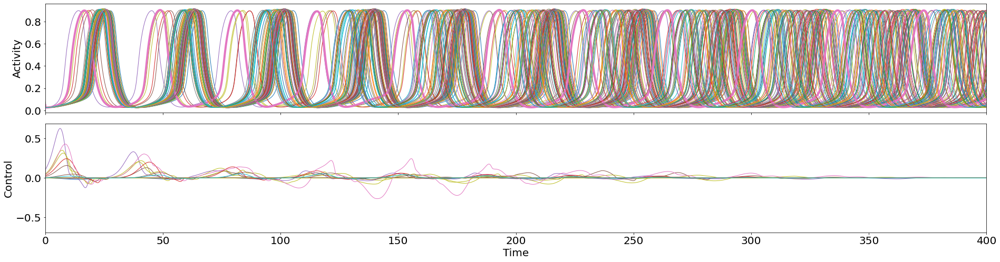

------------------------------------------------------------ wi =  16 -42.0
Optimal control with target oscillation period
Compute control for a deterministic system
Cost in iteration 0: 40.694705608746226
Final cost : 40.694705608746226
Compute control for a deterministic system
Cost in iteration 0: 20.528121027359276
Final cost : 20.528121027359276
Compute control for a deterministic system
Cost in iteration 0: 20.528121027359276
Cost in iteration 1: 20.528121004280727
Cost in iteration 2: 20.528120959028044
Cost in iteration 3: 20.52812087177793
Cost in iteration 4: 20.528120707734587
Cost in iteration 5: 20.52812040562041
Cost in iteration 6: 20.528119834586015
Final cost : 20.528119834586015
Compute control for a deterministic system
Cost in iteration 0: 20.528119834586015


In [ ]:
it = 6
d = data_2_L1
n_input_list = []

for wi in range(3,31):
    print("------------------------------------------------------------ wi = ", wi, d["weights"][wi])
    
    model = WCModel(Cmat=cmat_av, Dmat=dmat_av, seed=0)
    model.params.exc_init = d["init_state"][0]
    model.params.inh_init = d["init_state"][1]
    setparams(model)

    model.params["exc_ext_baseline"] =  d["coordinates"][0]
    model.params["inh_ext_baseline"] =  d["coordinates"][1]
    model.params.duration = duration

    model.run()

    model_controlled = oc_wc.OcWc(model, target_period, print_array=pr, cost_interval=(int0, int1), control_interval=(int0, int1), cost_matrix=costmat, control_matrix=controlmat)
    model_controlled.weights["w_p"] = 0.
    model_controlled.weights["w_1D"] = 1.
    model_controlled.weights["w_cc"] = d["weights"][wi]
    model_controlled.maximum_control_strength = max_cntrl
    
    model_controlled.optimize(0)
    
    if type(d["control"][wi]) != type(None):
        if d["control"][wi].ndim == 2:
            model_controlled.control = d["control"][wi].copy()
            model_controlled.update_input()

    model_controlled.channelwise_optimization = True
    model_controlled.optimize(0)
    
    cost0 = model_controlled.compute_total_cost()
    
    if convergence[wi] == 0:

        for j in range(1):
            model_controlled.grad_method = 0
            optimize_model(model_controlled, [-6, 0, 6, -2], wi, it)
            #model_controlled.grad_method = 1
            #optimize_model(model_controlled, [-6, 0, 6, -2], wi, it)

            cost1 = model_controlled.compute_total_cost()
            if np.abs(cost1 - cost0) < 1e-12:
                convergence[wi] = 1
                break
                
            cost0 = model_controlled.compute_total_cost()
    
    maxnodeind = np.argmax(np.sum(d["control"][wi]**2, axis=1))
    n_input = 0
    for n in range(N):
        if np.sum(d["control"][wi][n,:]**2) > 1e-1:
            n_input += 1
    n_input_list.append(n_input)
    
    print("max node ind, input nodes = ", maxnodeind, n_input)
    plot_control(model_controlled.control, model_controlled.get_xs(), duration, dt, fat=[maxnodeind], filename=None, title=None)

In [10]:
print(n_input_list)

[1, 3, 3, 4, 5, 7, 7, 6]


In [14]:
print(n_input_list)      #[0, 5, 10, 15, 20, 25, 30]

[1, 3, 3, 4, 5, 7, 6, 6, 9, 6, 6, 9, 9, 7, 8, 10, 10, 10, 13, 12, 12, 12]
